# Feature selection: B plasma

In [1]:
from pathlib import Path
from tqdm import tqdm
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata as ad

import scatlastb_utils as atl
from marker_genes_functions import get_marker_genes

sc.set_figure_params(frameon=False, dpi=300, dpi_save=300, fontsize=12)
plt.rcParams["svg.fonttype"] = "none"

/hpc/scratch/project.hca_integration/miniforge3/envs/scanpy/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
import yaml
from misc import back_to_back_barplot

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
figure_dir = Path('figures/figure5')
figure_dir.mkdir(exist_ok=True, parents=True)

## Read data

In [5]:
adata = atl.io.read_anndata(
    'data/input/hca_out/marker_genes/dataset~Benchmark_n_hvg_B_plasma/file_id~majority_voting:collect:Benchmark_n_hvg_B_plasma.zarr/',
    obsm='obsm',
    obs='obs',
    uns='uns',
    select_keys=r".*(?:metrics:harmony--strategy=(?:extra_hvg|hvg)--n_hvg=3000|cellhint|Level_[23]).*",
)

dask: False, backed: False
Read slot "obsm", store as "obsm"...
select only slots that match .*(?:metrics:harmony--strategy=(?:extra_hvg|hvg)--n_hvg=3000|cellhint|Level_[23]).*


Read obsm slots as_dask=False: 100%|██████████| 4/4 [00:00<00:00,  8.36it/s]

Read slot "obs", store as "obs"...


Read slot "uns", store as "uns"...
select only slots that match .*(?:metrics:harmony--strategy=(?:extra_hvg|hvg)--n_hvg=3000|cellhint|Level_[23]).*


Read uns slots as_dask=False: 100%|██████████| 31/31 [00:04<00:00,  7.10it/s]


shape: (830235, 0)


### Marker gene sets

In [6]:
gene_set_dir = '../../../immune-v1-scripts/configs/gene_sets'

In [7]:
marker_genes_file = f'{gene_set_dir}/final_markers/B_final_markers.yaml'
marker_genes_file = f'{gene_set_dir}/morans_i_genes.yaml'

In [8]:
with open(marker_genes_file, 'r') as f:
    marker_genes_dict = yaml.safe_load(f)['MARKER_GENES']

In [9]:
marker_genes_dict

{'TCD4': {'RTE': ['SOX4', 'CHI3L2', 'LRRN3'],
  'CD4+ T naive/CM': ['SELL', 'LEF1', 'TCF7'],
  'CD4+ T cyt': ['GZMA',
   'GZMB',
   'GZMH',
   'GNLY',
   'PRF1',
   'NKG7',
   'ADGRG1',
   'ZEB2'],
  'Treg': ['FOXP3', 'RTKN2', 'IL2RA', 'CTLA4', 'TIGIT', 'DUSP4']},
 'TCD8_NK': {'RTE': ['SOX4', 'CHI3L2', 'LRRN3'],
  'CD8+ T naive/CM': ['SELL', 'LEF1', 'TCF7'],
  'NK cell': ['TYROBP', 'KLRD1', 'KLRC1', 'KLRC2'],
  'NK CD16hi': ['FCGR3A'],
  'NK CD56hi': ['NCAM1', 'XCL1', 'XCL2', 'KLRC1'],
  'MAIT': ['TRAV1-2', 'NCR3', 'SLC4A10', 'KLRB1'],
  'gdT': ['TRDC', 'TRDV2', 'TRGV9'],
  'ILC': ['KIT', 'LINC01229', 'TTLL10', 'TRDC', 'TNFRSF18'],
  'dnT': ['FXYD2', 'AC004585.1', 'PTPN3', 'MIR4422HG']},
 'Myeloid': {'CD14+ Monocyte': ['CD14', 'CSF3R'],
  'CD16+ Monocyte': ['FCGR3A', 'CX3CR1', 'CDKN1C', 'CSF1R'],
  'CD16+ Monocyte C1Q': ['C1QA', 'C1QB', 'C1QC'],
  'cDC1': ['CLEC9A', 'THBD', 'CADM1', 'BATF3', 'C1orf54'],
  'cDC2': ['CLEC10A', 'CD1C'],
  'cDC3': ['CD1C', 'CD163', 'S100A8', 'S100A9', 'CD1

### BCR removed genes

In [10]:
def parse(input_path, types_to_remove=None, genes_to_keep=None):
    import re
    import pandas as pd
    
    df = pd.read_table(input_path, index_col=0)
    
    df['gene'] = df['Approved symbol']
    
    df['type'] = df['Approved name'].str.extract(
        r'\b(diversity|variable|joining|constant|locus)\b',
        flags=re.IGNORECASE,
        expand=False,
    )
    
    df['ig_group'] = df['Group name'].map({
        'Immunoglobulin heavy locus at 14q32.33': 'IGH',
        'Immunoglobulin lambda locus at 22q11.2': 'IGL',
        'Immunoglobulin kappa locus at 2p11.2': 'IGK',
        'Immunoglobulin heavy (IGH) orphons': 'IGH orphon',
        'Immunoglobulin kappa (IGK) orphons': 'IGK orphon',
        'Immunoglobulin lambda (IGL) orphons': 'IGL orphon',
    })
    
    df['group'] = df[['type', 'ig_group']].astype(str).agg(' '.join, axis=1)
    
    if types_to_remove is None:
        types_to_remove = df['type'].unique()
    
    query = 'type.isin(@types_to_remove)'
    
    if genes_to_keep:
        query += ' & ~`Approved symbol`.isin(@genes_to_keep)'
    
    df['removed'] = df.eval(query)
    
    return df

In [11]:
bcr_genes = pd.read_table(f'{gene_set_dir}/BCR_genes_to_remove.txt')
bcr_genes = pd.read_table(
    '../../../immune-v1-scripts/notebooks/feature_selection/BCR_genes.txt'
).set_index('Approved symbol')

bcr_genes = parse(
    input_path='../../../immune-v1-scripts/notebooks/feature_selection/BCR_genes.txt',
    types_to_remove=['diversity', 'variable', 'joining'],
)

In [12]:
bcr_genes.value_counts(['removed', 'type'], sort=False)

removed  type     
False    constant      22
         locus          3
True     diversity     37
         joining       22
         variable     347
Name: count, dtype: int64

In [13]:
bcr_genes.value_counts(['removed', 'ig_group', 'type'], sort=False)

removed  ig_group    type     
False    IGH         constant      11
                     locus          1
         IGH orphon  constant       1
         IGK         constant       1
                     locus          1
         IGL         constant       7
                     locus          1
         IGL orphon  constant       2
True     IGH         diversity     27
                     joining        9
                     variable     139
         IGH orphon  diversity     10
                     variable      26
         IGK         joining        5
                     variable      76
         IGK orphon  variable      29
         IGL         joining        7
                     variable      74
         IGL orphon  joining        1
                     variable       3
Name: count, dtype: int64

In [14]:
bcr_genes_df = bcr_genes[['group', 'gene', 'type']].reset_index(drop=True)

In [15]:
bcr_genes_df['type'] = pd.Categorical(
    bcr_genes_df['type'],
    categories=['variable', 'diversity', 'joining', 'constant', 'locus'], 
    ordered=True,
)

In [16]:
bcr_genes_df = bcr_genes_df.sort_values('type')

In [17]:
bcr_genes_df

,group,gene,type
215,variable IGH,IGHV4-55,variable
278,variable IGK,IGKV2-10,variable
277,variable IGK,IGKV2-4,variable
276,variable IGK,IGKV1D-43,variable
275,variable IGK,IGKV1-6,variable
...,...,...,...
132,constant IGH,IGHA1,constant
336,constant IGL orphon,IGLCOR22-1,constant
342,locus IGL,IGL,locus
37,locus IGH,IGH,locus


## UMAPs

In [18]:
colors = [
    'Level_2',
    'Level_3',
    # 'harmonized_cellhint',
    'leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000',
    # 'leiden_1.0_1--metrics:harmony--strategy=extra_hvg--n_hvg=3000',
]

### Fig 5A

Plotting colors:   0%|          | 0/1 [00:00<?, ?it/s]

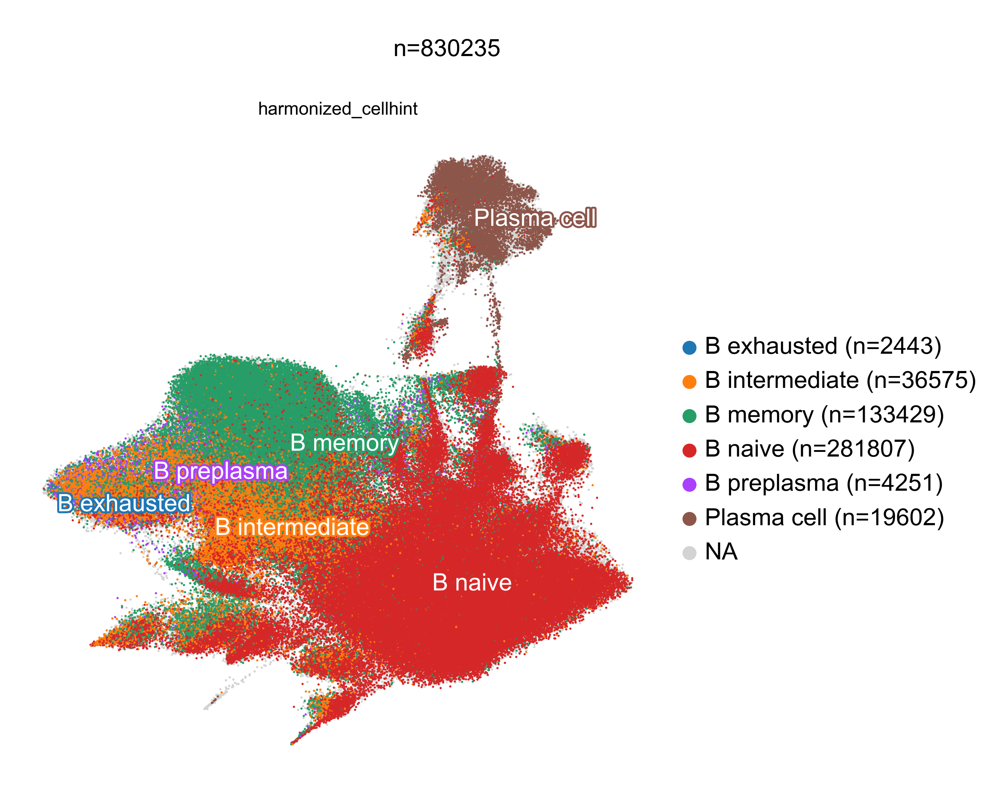

Plotting colors: 100%|██████████| 1/1 [00:08<00:00,  8.90s/it]


In [19]:
atl.pl.embedding(
    adata,
    basis='X_umap--metrics:harmony--strategy=hvg--n_hvg=3000',
    plot_centroids=['harmonized_cellhint'],
    max_label_length=20,
    size=5,
    verbose=False,
    legend_fontsize=12,
    luminance_threshold=0.6,
    downsample=0.5,
    output_dir=figure_dir,
    file_prefix=f'5A_default_hvg_',
    file_type='svg',
)

### Fig 5D

Plotting colors:   0%|          | 0/1 [00:00<?, ?it/s]

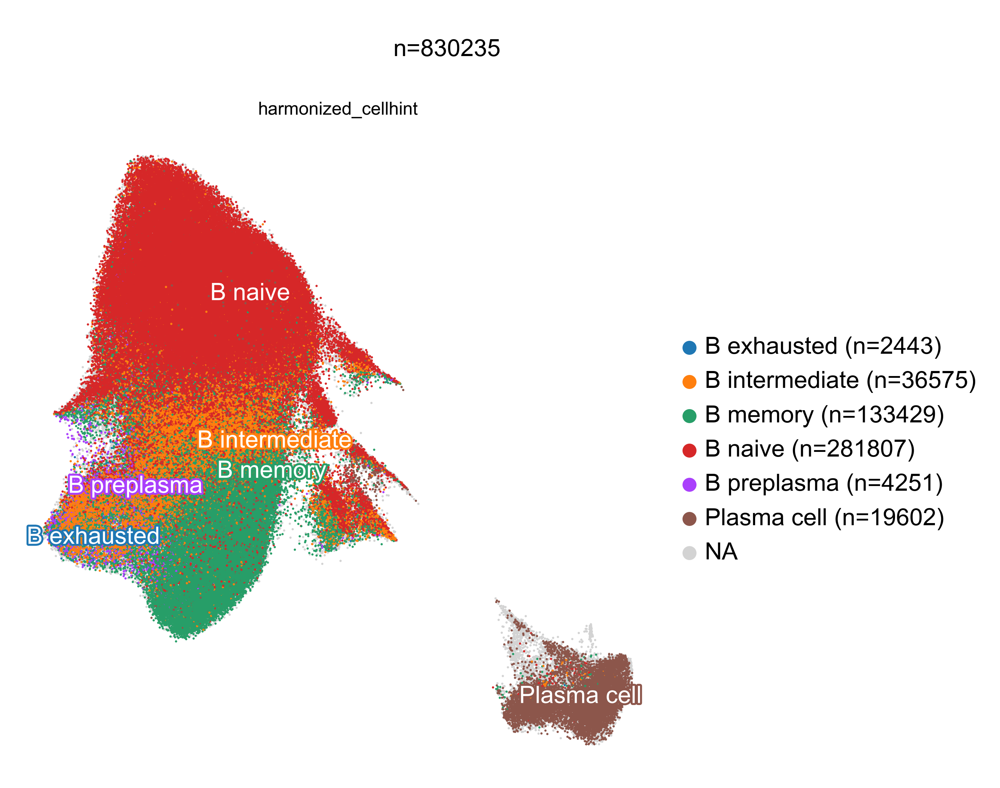

Plotting colors: 100%|██████████| 1/1 [00:08<00:00,  8.67s/it]


In [20]:
atl.pl.embedding(
    adata,
    basis='X_umap--metrics:harmony--strategy=extra_hvg--n_hvg=3000',
    plot_centroids=['harmonized_cellhint'],
    max_label_length=20,
    size=5,
    verbose=False,
    luminance_threshold=0.6,
    legend_fontsize=12,
    downsample=0.5,
    output_dir=figure_dir,
    file_prefix=f'5D_extra_hvg_',
    file_type='svg',
)

# Marker gene comparison

## Retrieve marker gene sets

In [21]:
n_genes = 20

In [22]:
marker_genes_dict_parsed = {}
for key, gene_map in marker_genes_dict.items():
    if key not in ['B', 'Plasma']:
        continue
    if isinstance(gene_map, list):
        marker_genes_dict_parsed[f'{key}'] = gene_map
        continue
    for cell_type, gene_list in gene_map.items():
        marker_genes_dict_parsed[cell_type] = gene_list

In [23]:
# Add IG genes
# marker_genes_dict_parsed[''] = ['']

In [24]:
curated_marker_df = pd.DataFrame(
    marker_genes_dict_parsed.items(),
    columns=['group', 'gene']
).explode('gene').reset_index(drop=True)
curated_marker_df.head()

,group,gene
0,B transitional,SOX4
1,B naive,TCL1A
2,B naive,FCER2
3,B memory,CD27
4,B memory,TNFRSF13B


In [25]:
curated_genes_df = pd.concat([curated_marker_df, bcr_genes_df])
curated_genes_df

,group,gene,type
0,B transitional,SOX4,NaN
1,B naive,TCL1A,NaN
2,B naive,FCER2,NaN
3,B memory,CD27,NaN
4,B memory,TNFRSF13B,NaN
...,...,...,...
132,constant IGH,IGHA1,constant
336,constant IGL orphon,IGLCOR22-1,constant
342,locus IGL,IGL,locus
37,locus IGH,IGH,locus


In [26]:
[x for x in adata.uns.keys() if 'marker' in x]

['marker_genes_group=Level_2',
 'marker_genes_group=Level_3',
 'marker_genes_group=harmonized_cellhint',
 'marker_genes_group=leiden_1.0_1--metrics:harmony--strategy=extra_hvg--n_hvg=3000',
 'marker_genes_group=leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000',
 'marker_genes_group=majority_reference--metrics:harmony--strategy=extra_hvg--n_hvg=3000',
 'marker_genes_group=majority_reference--metrics:harmony--strategy=hvg--n_hvg=3000']

In [27]:
# ground truth comp marker genes
marker_gene_cellhint_df = get_marker_genes(
    adata,
    key='marker_genes_group=harmonized_cellhint',
    n_genes=n_genes,
).query('group != "nan"')

marker_gene_lv2_df = get_marker_genes(
    adata,
    key='marker_genes_group=Level_2',
    n_genes=n_genes,
)

marker_gene_lv3_df = get_marker_genes(
    adata,
    key='marker_genes_group=Level_3',
    n_genes=n_genes,
)

In [28]:
marker_genes_df = get_marker_genes(
    adata,
    key='marker_genes_group=leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000',
    n_genes=n_genes,
)
marker_genes_df.head()

,group,gene,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,l2fc_abs
697170,0,LINC02518,0.164063,22.086203,0.869681,1.0,0.003077,0.0,22.086203
697169,0,ADCYAP1,0.164063,21.872126,0.869681,1.0,0.003077,0.0,21.872126
697465,0,AC073172.1,0.109376,21.149984,0.912905,1.0,0.002051,0.0,21.149984
697968,0,CLEC2A,0.054688,20.939829,0.956387,1.0,0.001026,0.0,20.939829
698007,0,AC078788.2,0.054688,20.750908,0.956387,1.0,0.001026,0.0,20.750908


In [29]:
from misc import run_similarity_analysis

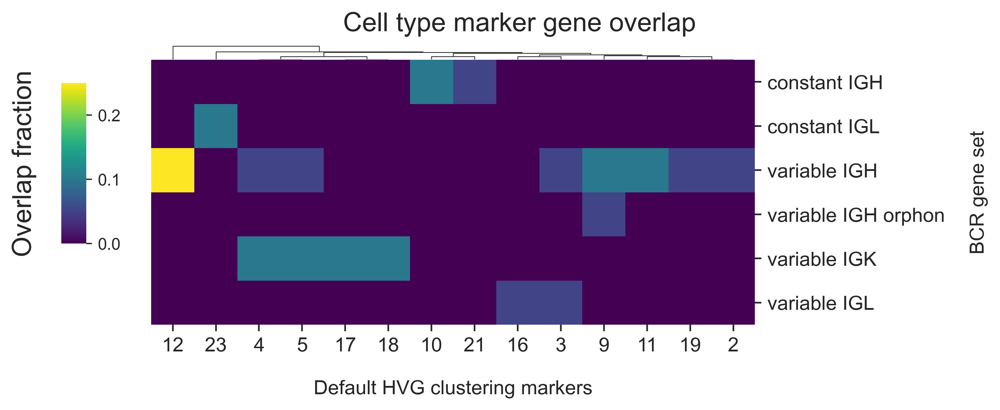

In [30]:
run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df2=bcr_genes_df,
    df2_label='BCR gene set',
    df1=marker_genes_df,
    df1_label='Default HVG clustering markers',
    keep_missing=True,
    title='Cell type marker gene overlap',
    figsize=(7, 3),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    row_cluster=False,
    # annot=True,
    # fmt='.1g',
    transpose=True,
)

### Ext Fig 5A

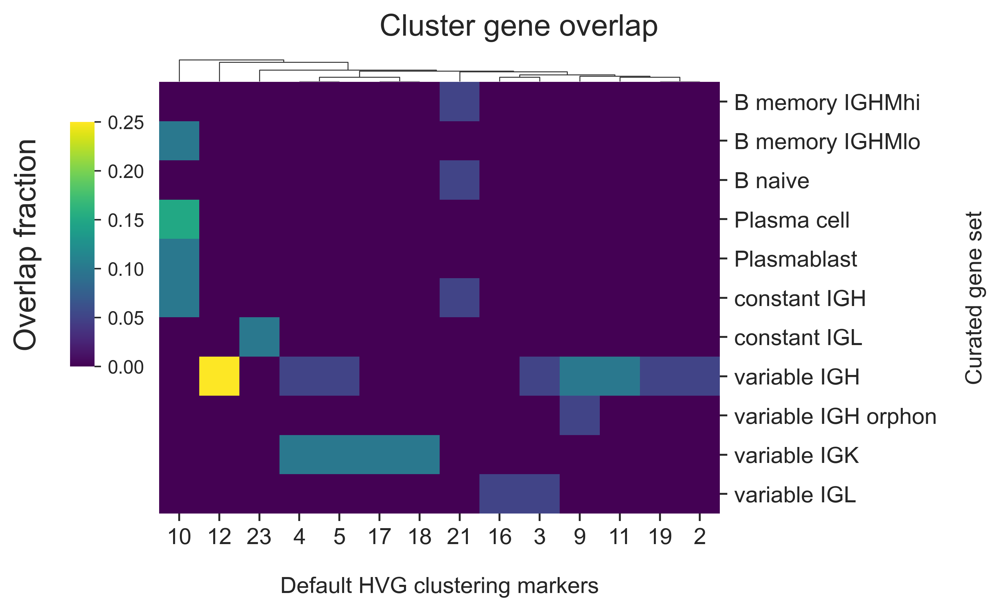

In [31]:
run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df2=curated_genes_df,
    df2_label='Curated gene set',
    df1=marker_genes_df,
    df1_label='Default HVG clustering markers',
    title='Cluster gene overlap',
    figsize=(6, 4),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    row_cluster=False,
    # annot=True,
    # fmt='.1g',
    transpose=True,
    save_dir=figure_dir,
)

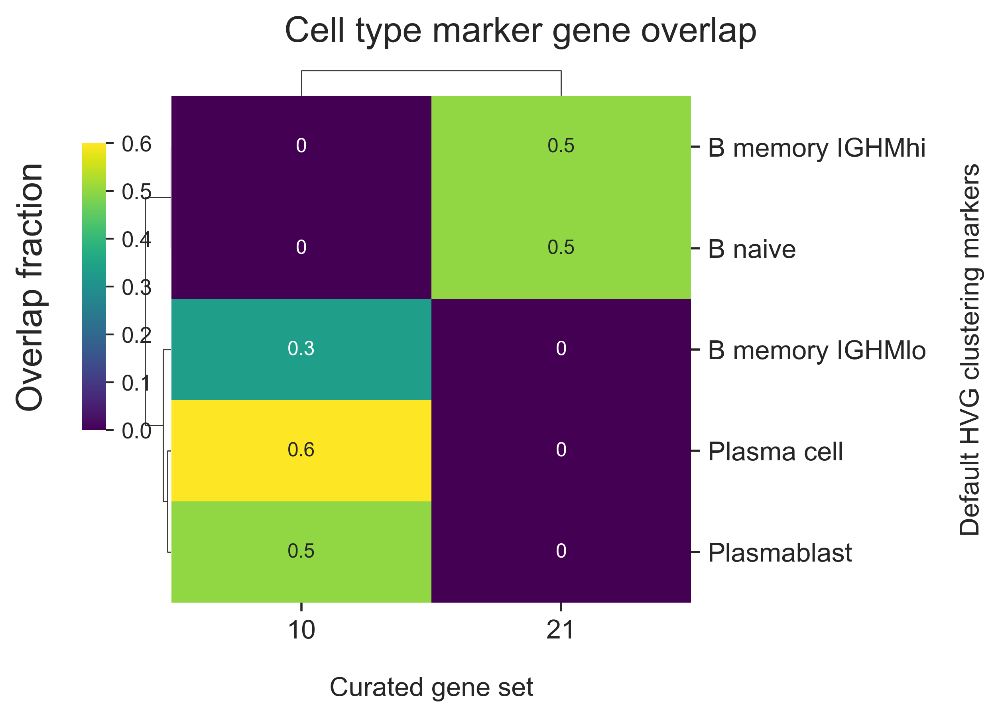

In [32]:
run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df1=curated_marker_df,
    df1_label='Curated gene set',
    df2=marker_genes_df,
    df2_label='Default HVG clustering markers',
    title='Cell type marker gene overlap',
    figsize=(5, 4),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    annot=True,
    fmt='.1g',
    transpose=False,
)

## Computational marker genes

Plotting colors:   0%|          | 0/1 [00:00<?, ?it/s]

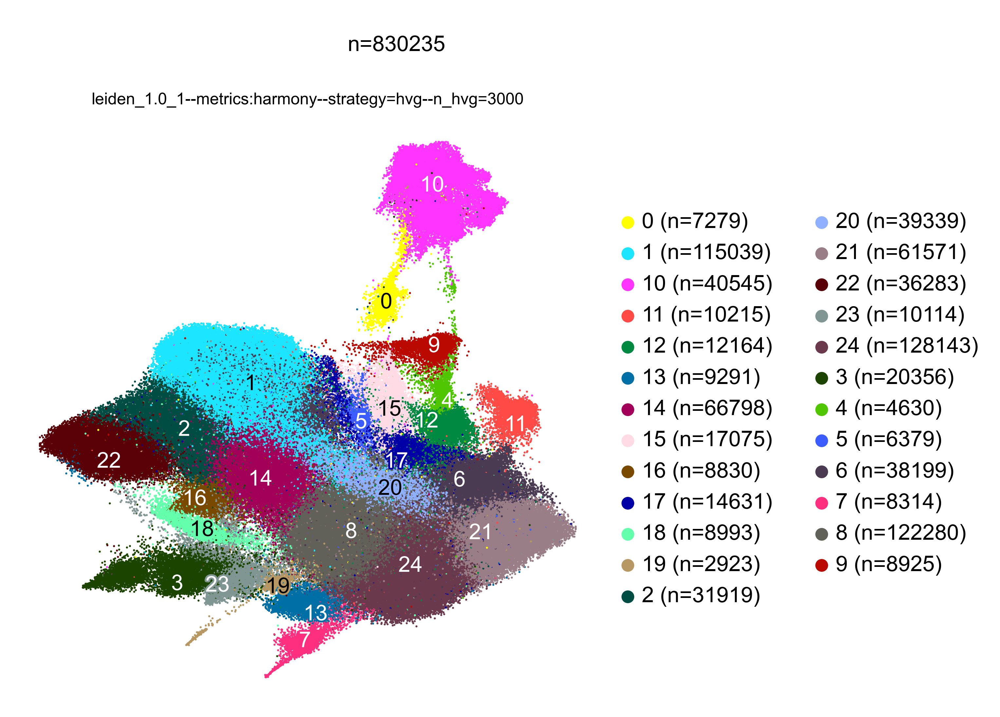

Plotting colors: 100%|██████████| 1/1 [00:05<00:00,  5.73s/it]


In [33]:
atl.pl.embedding(
    adata,
    basis='X_umap--metrics:harmony--strategy=hvg--n_hvg=3000',
    plot_centroids=['leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000'],
    # min_cells_per_category=100,
    max_label_length=20,
    size=5,
    verbose=False,
    legend_fontsize=12,
    luminance_threshold=0.6,
    downsample=0.5,
)

In [34]:
marker_genes_df.groupby('group').head(5)

,group,gene,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,l2fc_abs
697170,0,LINC02518,0.164063,22.086203,0.869681,1.0,0.003077,0.000000,22.086203
697169,0,ADCYAP1,0.164063,21.872126,0.869681,1.0,0.003077,0.000000,21.872126
697465,0,AC073172.1,0.109376,21.149984,0.912905,1.0,0.002051,0.000000,21.149984
697968,0,CLEC2A,0.054688,20.939829,0.956387,1.0,0.001026,0.000000,20.939829
698007,0,AC078788.2,0.054688,20.750908,0.956387,1.0,0.001026,0.000000,20.750908
...,...,...,...,...,...,...,...,...,...
622047,9,IGHV3-53,53.976086,32.782692,0.000000,0.0,0.969808,0.082082,32.782692
622048,9,IGHV3-66,53.347469,29.999290,0.000000,0.0,0.957914,0.067449,29.999290
622154,9,OR13C2,0.051561,20.763735,0.958878,1.0,0.000915,0.000000,20.763735
622155,9,LINC02844,0.051561,20.533995,0.958878,1.0,0.000915,0.000000,20.533995


In [35]:
marker_genes_df.groupby('group')['gene'].apply(lambda x: x.head(5).tolist()).to_dict()

{'0': ['LINC02518', 'ADCYAP1', 'AC073172.1', 'CLEC2A', 'AC078788.2'],
 '1': ['MALAT1', 'RPS27', 'EEF1A1', 'RPLP1', 'RPL41'],
 '10': ['JCHAIN', 'MZB1', 'HSP90B1', 'PPIB', 'SEC11C'],
 '11': ['AC233755.2', 'IGHV3-43', 'IGHV3-20', 'AC012494.1', 'AC022916.4'],
 '12': ['IGHV4-31', 'CDY2A', 'LINC01082', 'AC024257.1', 'AC103982.1'],
 '13': ['AC091182.2', 'LINC01927', 'OR1F1', 'AC025576.3', 'AL353586.1'],
 '14': ['MALAT1', 'EEF1A1', 'RPS27', 'RPS18', 'RPL10'],
 '15': ['TRBV25OR9-2', 'AL035691.1', 'EXOC1L', 'HS6ST2-AS1', 'SLC5A1'],
 '16': ['LYZL4', 'TRAJ48', 'DMBT1', 'IGLV3-17', 'AC084734.1'],
 '17': ['IGKV1-39', 'IGKV1D-39', 'AL663058.2', 'ADH7', 'ETS1-AS1'],
 '18': ['IGKV2-30', 'CDRT15L2', 'IGKV2D-30', 'HSPB7', 'LINC01955'],
 '19': ['AC105254.1', 'PPEF1-AS1', 'MAGEC1', 'AC055733.2', 'LINC02424'],
 '2': ['IGHV3-30-2', 'AC093765.4', 'PTPRJ-AS1', 'TM4SF1-AS1', 'LINC01339'],
 '20': ['AC017006.1', 'AC004448.1', 'AL355836.3', 'AL627443.3', 'AC011124.1'],
 '21': ['TCL1A', 'IGHM', 'MALAT1', 'CD74', 'T

In [36]:
groups = [
    # IGKV
    '4',
    '5',
    '17',
    '18',
    # IGHV
    '9',
    '11',
    '12',
    # IGL
    '16',
    '23',
]

### Fig 5B

Plotting colors:   0%|          | 0/1 [00:00<?, ?it/s]

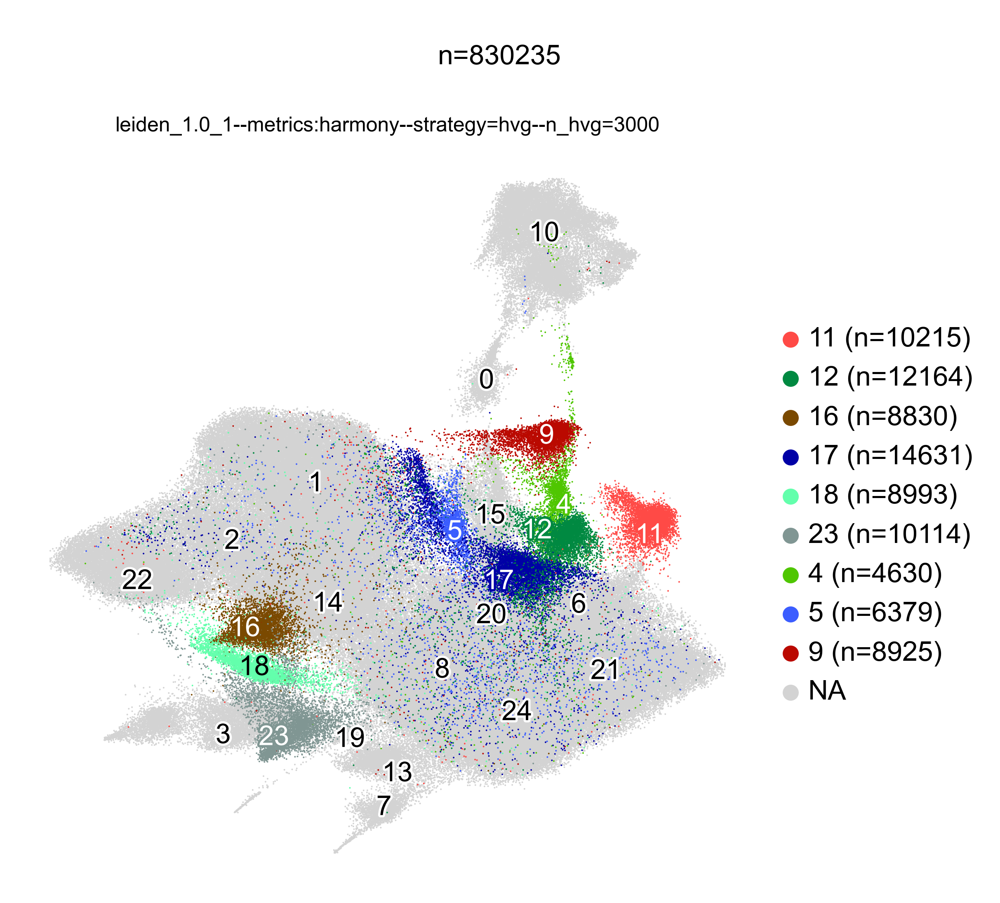

Plotting colors: 100%|██████████| 1/1 [00:08<00:00,  8.37s/it]


In [37]:
atl.pl.embedding(
    adata,
    basis='X_umap--metrics:harmony--strategy=hvg--n_hvg=3000',
    plot_centroids=['leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000'],
    groups=groups,
    # min_cells_per_category=100,
    max_label_length=20,
    size=2,
    verbose=False,
    legend_fontsize=12,
    luminance_threshold=0.6,
    downsample=0.5,
    output_dir=figure_dir,
    file_prefix=f'5B_extra_hvg_',
    file_type='svg',
)

### Fig 5C

/tmp/ipykernel_378457/2205690245.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


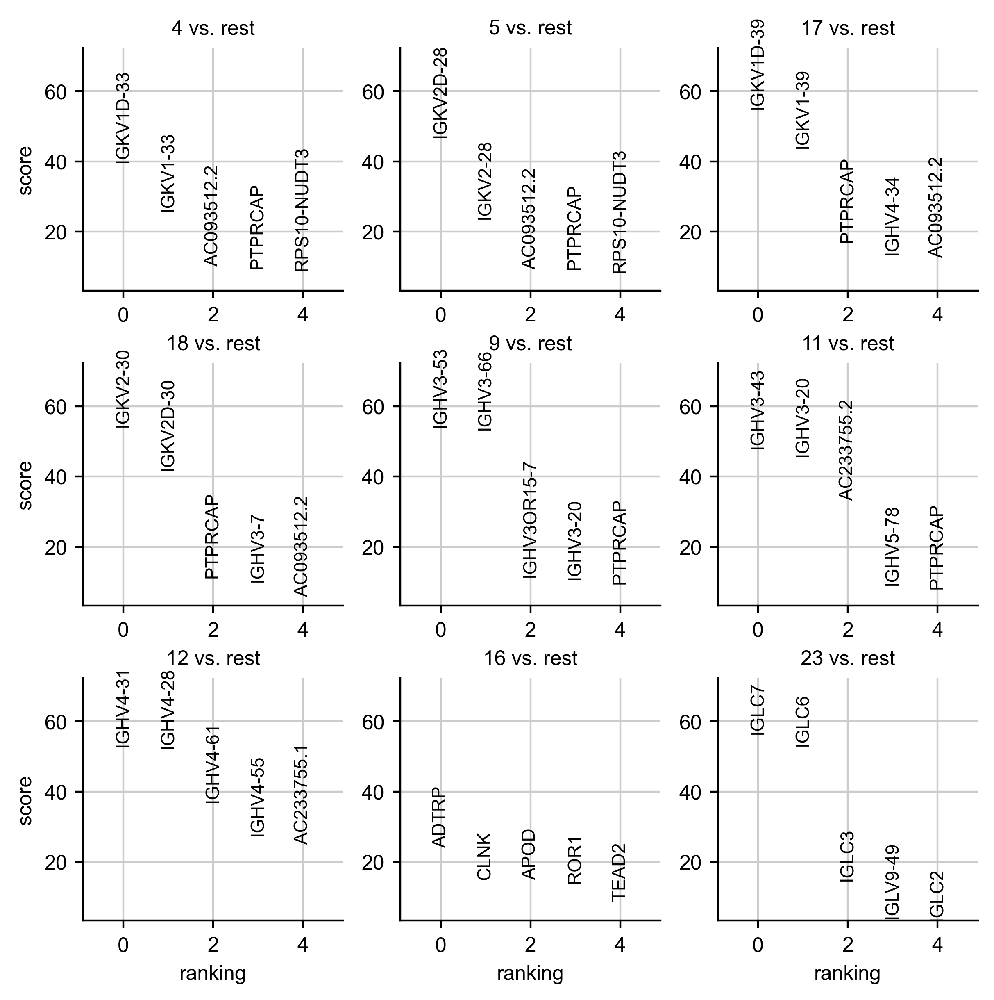

In [38]:
sc.pl.rank_genes_groups(
    adata,
    key='marker_genes_group=leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000',
    groups=groups,
    ncols=3,
    # fontsize=12,
    n_genes=5,
    show=False,
)
fig = plt.gcf()
fig.set_size_inches(7, 7)

for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(figure_dir / '5C_marker_genes.svg')
plt.show()

## Compare against computational markers

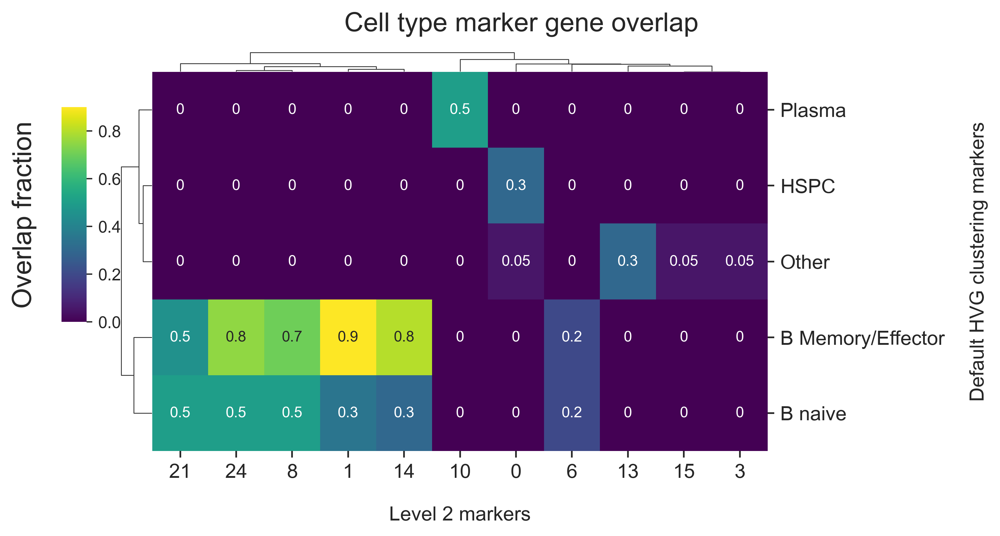

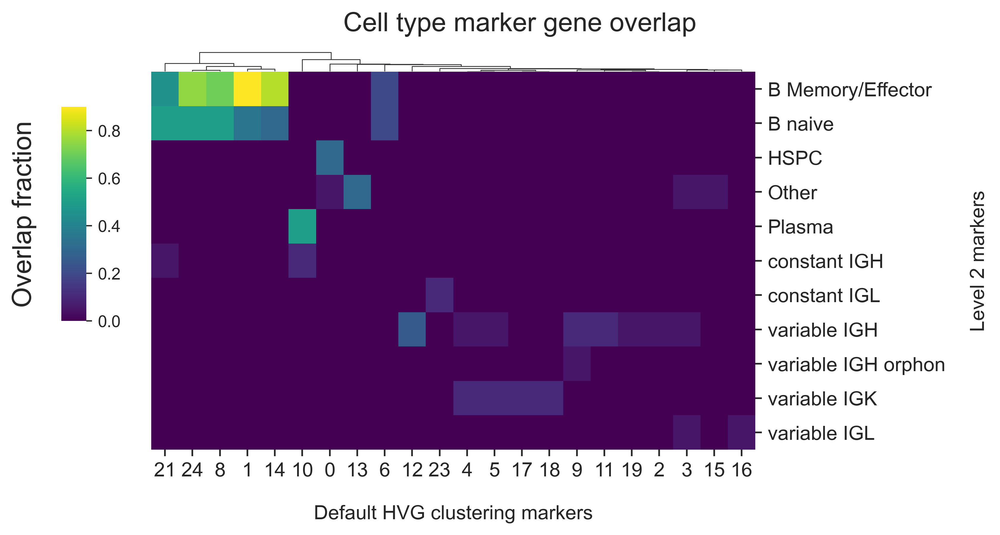

In [39]:
run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df1=marker_gene_lv2_df,
    df1_label='Level 2 markers',
    df2=marker_genes_df,
    df2_label='Default HVG clustering markers',
    title='Cell type marker gene overlap',
    figsize=(7, 4),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    annot=True,
    fmt='.1g',
    transpose=False,
)

run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df2=pd.concat([marker_gene_lv2_df, bcr_genes_df]),
    df2_label='Level 2 markers',
    df1=marker_genes_df,
    df1_label='Default HVG clustering markers',
    title='Cell type marker gene overlap',
    figsize=(7, 4),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    row_cluster=False,
    transpose=True,
)


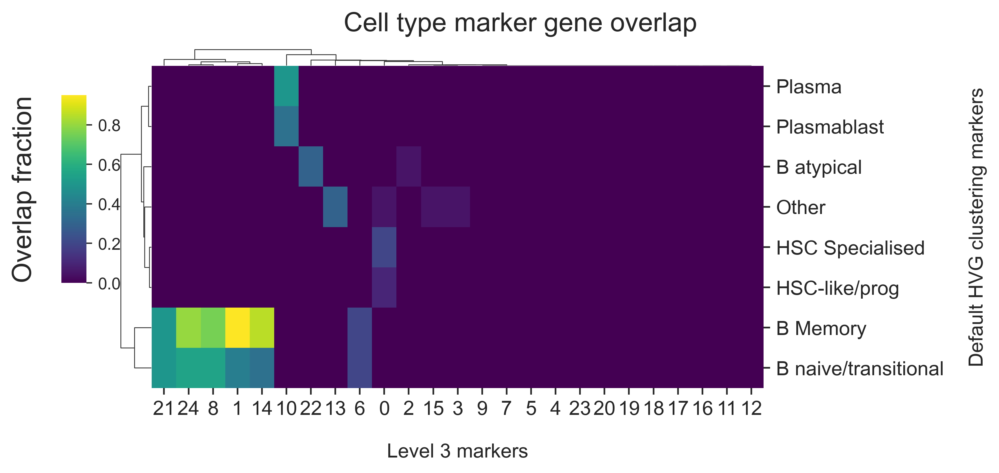

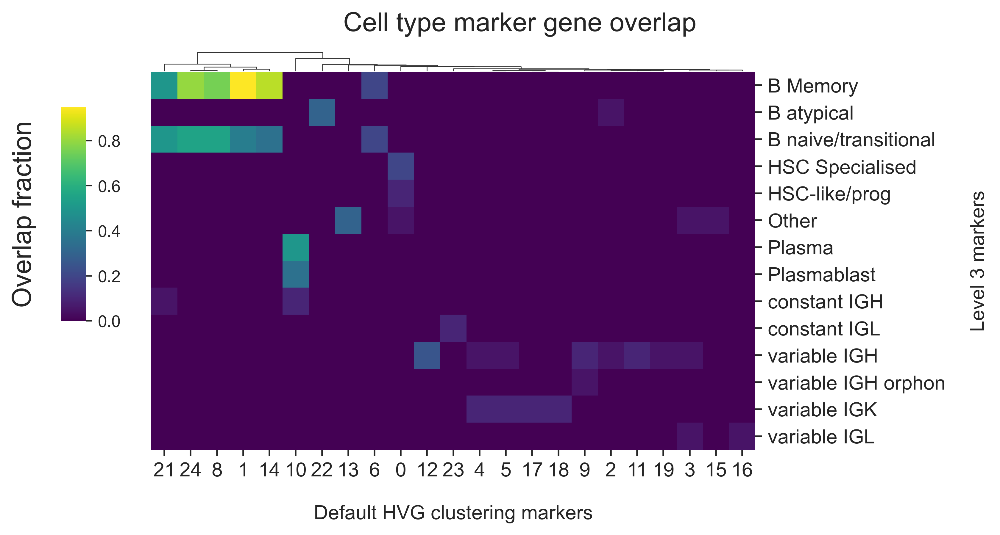

In [40]:
run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df1=marker_gene_lv3_df,
    df1_label='Level 3 markers',
    df2=marker_genes_df,
    df2_label='Default HVG clustering markers',
    title='Cell type marker gene overlap',
    figsize=(7, 3.5),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    # annot=True,
    # fmt='.1g',
    transpose=False,
    filter_0=False,
)

run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df2=pd.concat([marker_gene_lv3_df, bcr_genes_df]),
    df2_label='Level 3 markers',
    df1=marker_genes_df,
    df1_label='Default HVG clustering markers',
    title='Cell type marker gene overlap',
    figsize=(7, 4),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    row_cluster=False,
    transpose=True,
    # filter_0=False,
)


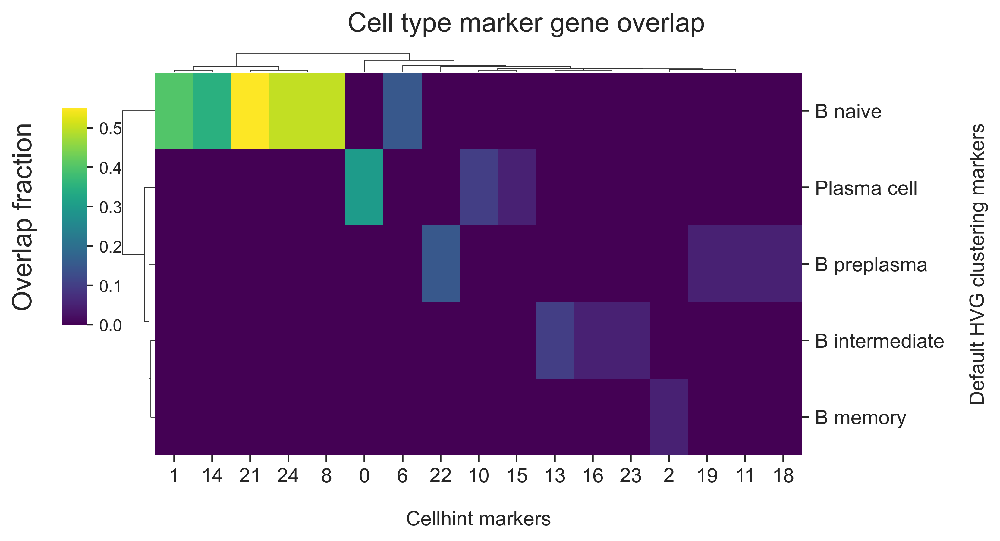

In [41]:
run_similarity_analysis(
    group_col='group',
    value_col='gene',
    df1=marker_gene_cellhint_df,
    df1_label='Cellhint markers',
    df2=marker_genes_df,
    df2_label='Default HVG clustering markers',
    title='Cell type marker gene overlap',
    figsize=(7, 4),
    cmap='viridis',
    metric='overlap',
    cbar_name='Overlap fraction',
    keep_missing=True,
    # annot=True,
    # fmt='.1g',
    transpose=False,
)

Plotting colors:   0%|          | 0/1 [00:00<?, ?it/s]

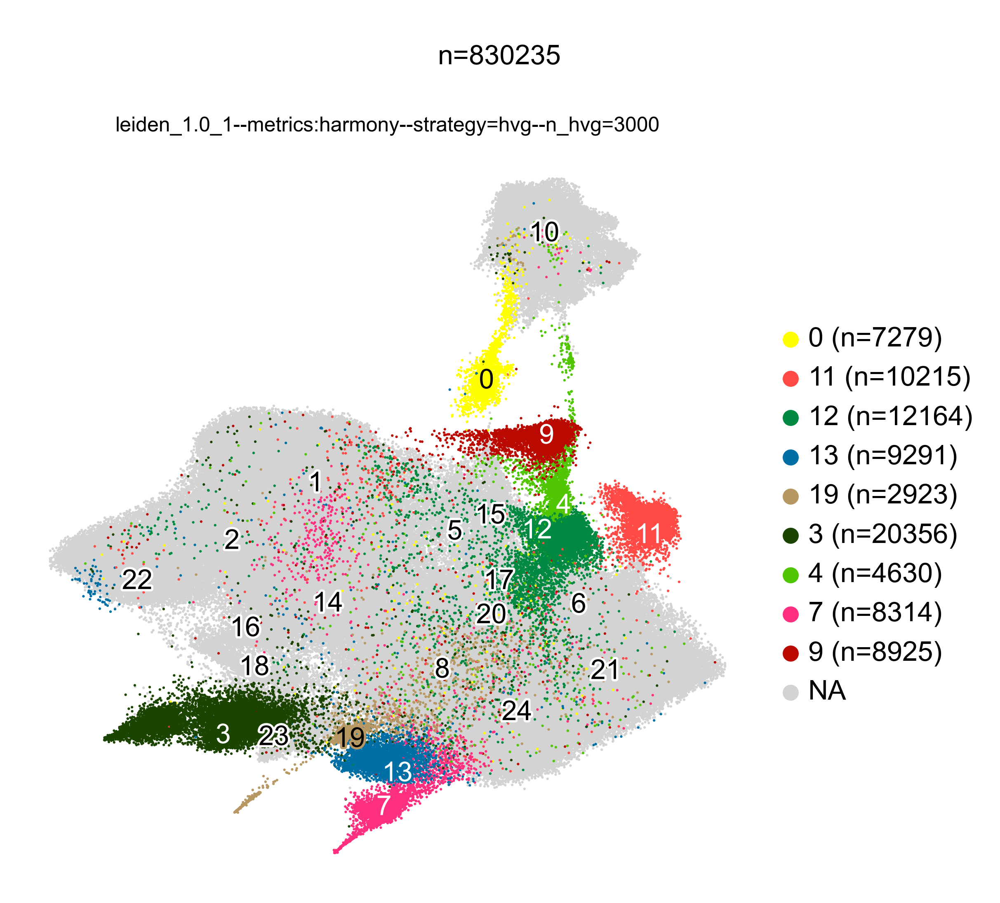

Plotting colors: 100%|██████████| 1/1 [00:05<00:00,  5.24s/it]


In [42]:
atl.pl.embedding(
    adata,
    basis='X_umap--metrics:harmony--strategy=hvg--n_hvg=3000',
    plot_centroids=['leiden_1.0_1--metrics:harmony--strategy=hvg--n_hvg=3000'],
    # min_cells_per_category=100,
    max_label_length=20,
    groups=[
        '4',
        #'10',
        '12',
        #'1',
        # '5',
        '0',
        # '6',
        '11',
        '13',
        '7',
        '9',
        # '8',
        # '2',
        '3',
        '19',
    ],
    size=5,
    verbose=False,
    legend_fontsize=12,
    luminance_threshold=0.6,
    downsample=0.5
)

Plotting colors:   0%|          | 0/1 [00:00<?, ?it/s]

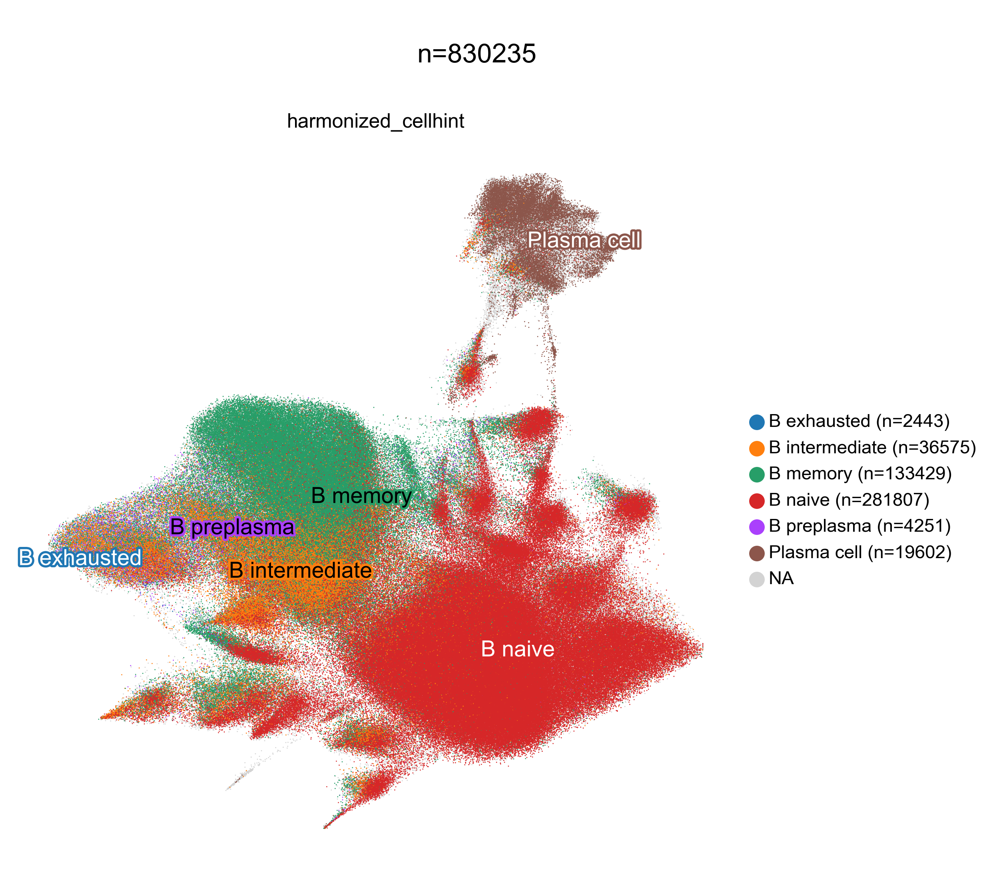

Plotting colors: 100%|██████████| 1/1 [00:08<00:00,  8.29s/it]


In [43]:
atl.pl.embedding(
    adata,
    basis='X_umap--metrics:harmony--strategy=hvg--n_hvg=3000',
    plot_centroids=['harmonized_cellhint'],
    # min_cells_per_category=100,
    max_label_length=20,
    verbose=False,
)